In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random
import tensorflow as tf
from tqdm import tqdm
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
from sklearn.model_selection import train_test_split
from keras.models import Model, load_model
from keras.layers import (Conv2D, Lambda, LeakyReLU, Dense, Input, add, concatenate, Flatten, BatchNormalization, PReLU, UpSampling2D)
from keras.applications.vgg19 import VGG19, preprocess_input

In [2]:
# --- Helper Function to Convert BGR -> RGB for Display ---
def bgr_to_rgb(image):
    """Convert a BGR image (H,W,3) to RGB for display purposes."""
    return image[..., ::-1]

# --- Learning Rate Schedule ---
def lr_schedule(epoch):
    """Modified warmup + decay schedule"""
    if epoch < 5:
        return 1e-5  # Initial warmup
    elif epoch < 20:
        return 1e-4  # High learning phase
    else:
        return 1e-4 * (0.95 ** (epoch // 10))  # Gentle decay

# Initialize Optimizers
gen_optimizer = tf.keras.optimizers.Adam(1e-4, beta_1=0.9, beta_2=0.999)
disc_optimizer = tf.keras.optimizers.Adam(1e-5, beta_1=0.9, beta_2=0.999)

In [3]:
# --- ESRGAN Model Components ---

# RRDB (Residual-in-Residual Dense Block)
def rrdb_block(input_tensor, filters=64, gc=32):
    x1 = Conv2D(gc, (3,3), padding='same')(input_tensor)
    x1 = LeakyReLU(alpha=0.2)(x1)
    x1 = Lambda(lambda x: x * 0.2, output_shape=lambda s: s)(x1)
    x1 = concatenate([input_tensor, x1])
    
    x2 = Conv2D(gc, (3,3), padding='same')(x1)
    x2 = LeakyReLU(alpha=0.2)(x2)
    x2 = concatenate([x1, x2])
    
    x3 = Conv2D(gc, (3,3), padding='same')(x2)
    x3 = LeakyReLU(alpha=0.2)(x3)
    x3 = concatenate([x2, x3])
    
    x4 = Conv2D(filters, (3,3), padding='same')(x3)
    x4 = Lambda(lambda x: x * 0.2, output_shape=lambda s: s)(x4)
    return add([input_tensor, x4])

# Upscale block 
def upscale_block(ip):
    x = Conv2D(256, (3,3), padding='same')(ip)
    x = Lambda(lambda x: tf.nn.depth_to_space(x, block_size=2), output_shape=lambda s: (s[0], s[1]*2, s[2]*2, s[3]//4))(x)
    return LeakyReLU(alpha=0.2)(x)

# ESRGAN Generator with RRDB blocks
def create_gen(gen_ip, num_res_block=23):  # 23 RRDB blocks
    x = Conv2D(64, (3,3), padding='same')(gen_ip)
    x = LeakyReLU(alpha=0.2)(x)  # Changed from PReLU
    temp = x
    for _ in range(num_res_block):
        x = rrdb_block(x)
    x = Conv2D(64, (3,3), padding='same')(x)
    x = add([x, temp])
    x = upscale_block(x)
    x = upscale_block(x)
    x = Conv2D(3, (3,3), padding='same', activation='sigmoid', dtype='float32')(x)
    return Model(gen_ip, x)

# ESRGAN Relativistic Discriminator 
def create_disc(disc_ip):
    df = 64
    x = Conv2D(df, (3,3), padding='same')(disc_ip)
    x = LeakyReLU(alpha=0.2)(x)
    
    # Enhanced discriminator
    for _ in range(2):  # Extra layers
        x = Conv2D(df, (3,3), strides=2, padding='same')(x)
        x = LeakyReLU(alpha=0.2)(x)
    
    x = Conv2D(df*2, (3,3), padding='same')(x)
    x = LeakyReLU(alpha=0.2)(x)
    
    for _ in range(2):  # Extra layers
        x = Conv2D(df*2, (3,3), strides=2, padding='same')(x)
        x = LeakyReLU(alpha=0.2)(x)
    
    x = Conv2D(df*4, (3,3), padding='same')(x)
    x = LeakyReLU(alpha=0.2)(x)
    
    x = Conv2D(df*4, (3,3), strides=2, padding='same')(x)
    x = LeakyReLU(alpha=0.2)(x)
    
    x = Conv2D(df*8, (3,3), padding='same')(x)
    x = LeakyReLU(alpha=0.2)(x)
    
    x = Conv2D(df*8, (3,3), strides=2, padding='same')(x)
    x = LeakyReLU(alpha=0.2)(x)
    
    x = Flatten()(x)
    x = Dense(df*16, kernel_initializer='orthogonal')(x)
    x = LeakyReLU(alpha=0.2)(x)
    x = Dense(1, kernel_initializer='orthogonal')(x)
    return Model(disc_ip, x)

# VGG19 Feature Extractor:
def build_vgg(hr_shape):
    inp = Input(shape=hr_shape, dtype='float32')
    preprocessed = Lambda(lambda x: preprocess_input(x * 255.0), output_shape=lambda s: s)(inp)
    base_vgg = VGG19(weights="imagenet", include_top=False, input_tensor=preprocessed)
    features = base_vgg.get_layer("block5_conv4").output
    return Model(inputs=inp, outputs=features)

In [4]:
# Combined model for perceptual loss
def create_comb(gen_model, disc_model, vgg, lr_ip, hr_ip):
    gen_img = gen_model(lr_ip)
    gen_features = vgg(gen_img)
    disc_model.trainable = False
    validity = disc_model(gen_img)
    return Model(inputs=[lr_ip, hr_ip], outputs=[validity, gen_features])

In [5]:
# Data Loading
n = 5000  # Number of images to use
lr_path = "/kaggle/input/sr-dataset/DATASET/AUG/LR_Aug"
hr_path = "/kaggle/input/sr-dataset/DATASET/AUG/HR_Aug"

lr_list = os.listdir(lr_path)[:n]
hr_list = os.listdir(hr_path)[:n]

lr_images = []
hr_images = []

# Load images and keep them in BGR (for VGG)
for img in lr_list:
    img_path = os.path.join(lr_path, img)
    img_lr = cv2.imread(img_path)  # BGR format
    lr_images.append(img_lr)

for img in hr_list:
    img_path = os.path.join(hr_path, img)
    img_hr = cv2.imread(img_path)  # BGR format
    hr_images.append(img_hr)

lr_images = np.array(lr_images, dtype=np.float32) / 255.0
hr_images = np.array(hr_images, dtype=np.float32) / 255.0

print(f"LR shape: {lr_images[0].shape}, HR shape: {hr_images[0].shape}")
print(f"LR range: [{lr_images.min()}, {lr_images.max()}]")
print(f"HR range: [{hr_images.min()}, {hr_images.max()}]")

LR shape: (64, 64, 3), HR shape: (256, 256, 3)
LR range: [0.0, 1.0]
HR range: [0.0, 1.0]


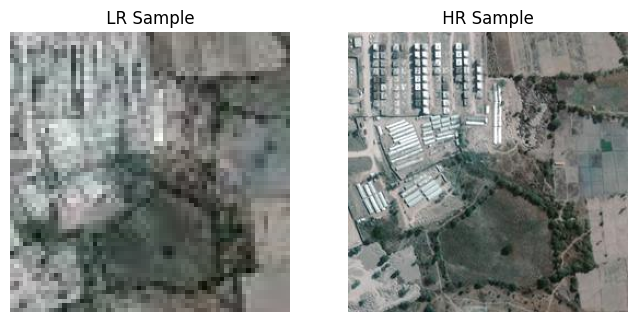

In [8]:
# Visualizing Random Images
random_idx = random.randint(0, len(lr_images)-1)
plt.figure(figsize=(8,8))
plt.subplot(2, 2, 1)
plt.imshow(bgr_to_rgb(lr_images[random_idx]))
plt.title(" LR Sample ")
plt.axis("off")
plt.subplot(2, 2, 2)
plt.imshow(bgr_to_rgb(hr_images[random_idx]))
plt.title(" HR Sample ")
plt.axis("off")
plt.show()

In [9]:
# Train-test split
lr_train, lr_test, hr_train, hr_test = train_test_split(lr_images, hr_images, test_size=0.33, random_state=42)
hr_shape = (256,256,3)
lr_shape = (64,64,3)

In [10]:
# --- Model Initialization ---
generator = create_gen(Input(lr_shape))
generator.summary()

discriminator = create_disc(Input(hr_shape))
discriminator.compile(loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
                      optimizer=disc_optimizer,
                      metrics=['accuracy'])
discriminator.summary()

vgg = build_vgg(hr_shape)
print(vgg.summary())
vgg.trainable = False

/usr/local/lib/python3.10/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 64, 64, 3)      │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 64, 64, 64)     │          1,792 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu (LeakyReLU)   │ (None, 64, 64, 64)     │              0 │ conv2d[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 64, 64, 32)     │         18,464 │ leaky_re_lu[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_1 (LeakyReLU) │ (None, 64, 64, 32)     │              0 │ conv2d_1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda (Lambda)           │ (None, 64, 64, 32)     │              0 │ leaky_re_lu_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 64, 64, 96)     │              0 │ leaky_re_lu[0][0],     │
│                           │                        │                │ lambda[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 64, 64, 32)     │         27,680 │ concatenate[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_2 (LeakyReLU) │ (None, 64, 64, 32)     │              0 │ conv2d_2[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_1             │ (None, 64, 64, 128)    │              0 │ concatenate[0][0],     │
│ (Concatenate)             │                        │                │ leaky_re_lu_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 64, 64, 32)     │         36,896 │ concatenate_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_3 (LeakyReLU) │ (None, 64, 64, 32)     │              0 │ conv2d_3[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_2             │ (None, 64, 64, 160)    │              0 │ concatenate_1[0][0],   │
│ (Concatenate)             │                        │                │ leaky_re_lu_3[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 64, 64, 64)     │         92,224 │ concatenate_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_1 (Lambda)         │ (None, 64, 64, 64)     │              0 │ conv2d_4[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 64, 64, 64)     │              0 │ leaky_re_lu[0][0],     │
│                           │                        │                │ lambda_1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, 64, 64, 32)     │         18,464 │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_4 (LeakyR

 Total params: 4,366,947 (16.66 MB)

 Trainable params: 4,366,947 (16.66 MB)

 Non-trainable params: 0 (0.00 B)

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 256, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_97 (Conv2D)                   │ (None, 256, 256, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_72 (LeakyReLU)           │ (None, 256, 256, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_98 (Conv2D)                   │ (None, 128, 128, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_73 (LeakyReLU)           │ (None, 128, 128, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_99 (Conv2D)                   │ (None, 64, 64, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_74 (LeakyReLU)           │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_100 (Conv2D)                  │ (None, 64, 64, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_75 (LeakyReLU)           │ (None, 64, 64, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_101 (Conv2D)                  │ (None, 32, 32, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_76 (LeakyReLU)           │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_102 (Conv2D)                  │ (None, 16, 16, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_77 (LeakyReLU)           │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_103 (Conv2D)                  │ (None, 16, 16, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_78 (LeakyReLU)           │ (None, 16, 16, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_104 (Conv2D)                  │ (None, 8, 8, 256)           │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_79 (LeakyReLU)           │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_105 (Conv2D)                  │ (None, 8, 8, 512)           │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_80 (LeakyReLU)           │ (None, 8, 8, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_106 (Conv2D)                  │ (None, 4, 4, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_81 (LeakyReLU)           │ (None, 4, 4, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 13,260,545 (50.58 MB)

 Trainable params: 13,260,545 (50.58 MB)

 Non-trainable params: 0 (0.00 B)

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, 256, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lambda_48 (Lambda)                   │ (None, 256, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 256, 256, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 256, 256, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 128, 128, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 128, 128, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 128, 128, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 64, 64, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 64, 64, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 64, 64, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 64, 64, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv4 (Conv2D)                │ (None, 64, 64, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 32, 32, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 32, 32, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 32, 32, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 32, 32, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv4 (Conv2D)                │ (None, 32, 32, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 16, 16, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 16, 16, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 16, 16, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 16, 16, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 20,024,384 (76.39 MB)

 Trainable params: 20,024,384 (76.39 MB)

 Non-trainable params: 0 (0.00 B)

None


In [11]:
# --- Training Parameters ---
batch_size = 8
epochs = 10
train_dataset = tf.data.Dataset.from_tensor_slices((lr_train, hr_train)).batch(batch_size)

In [12]:
# Loss tracking lists
gen_losses = []
disc_losses = []

In [13]:
# Training Loop
for epoch in range(epochs):
    # Update learning rate
    gen_optimizer.learning_rate.assign(lr_schedule(epoch))
    
    print(f"\nEpoch {epoch+1}/{epochs}")
    epoch_gen_loss = 0.0
    epoch_disc_loss = 0.0
    num_batches = 0
    
    for lr_batch, hr_batch in tqdm(train_dataset):
        current_bs = lr_batch.shape[0]
        
        # --- Discriminator Update ---
        with tf.GradientTape() as disc_tape:
            fake_hr = generator(lr_batch, training=True)
            real_output = discriminator(hr_batch, training=True)
            fake_output = discriminator(fake_hr, training=True)
            
            real_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(
                labels=tf.ones_like(real_output),
                logits=real_output - tf.reduce_mean(fake_output)
            ))
            fake_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(
                labels=tf.zeros_like(fake_output),
                logits=fake_output - tf.reduce_mean(real_output)
            ))
            disc_loss = 0.5 * (real_loss + fake_loss)
            
            # Gradient Penalty (10x weight)
            alpha = tf.random.uniform([current_bs, 1, 1, 1], 0.0, 1.0)
            interpolated = alpha * hr_batch + (1 - alpha) * fake_hr
            with tf.GradientTape() as gp_tape:
                gp_tape.watch(interpolated)
                pred = discriminator(interpolated)
            grads = gp_tape.gradient(pred, interpolated)
            grad_norm = tf.sqrt(tf.reduce_sum(tf.square(grads), axis=[1,2,3]))
            gradient_penalty = tf.reduce_mean((grad_norm - 1.0)**2)
            disc_loss += 10.0 * gradient_penalty  # Critical fix
        
        disc_grads = disc_tape.gradient(disc_loss, discriminator.trainable_weights)
        disc_optimizer.apply_gradients(zip(disc_grads, discriminator.trainable_weights))
        
        # --- Generator Update ---
        with tf.GradientTape() as gen_tape:
            fake_hr = generator(lr_batch, training=True)
            fake_output = discriminator(fake_hr)
            real_output = discriminator(hr_batch)
            
            gen_adv_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(
                labels=tf.ones_like(fake_output),
                logits=fake_output - tf.reduce_mean(real_output)
            ))
            
            gen_features = vgg(fake_hr)
            real_features = vgg(hr_batch)
            gen_content_loss = tf.reduce_mean(tf.square(gen_features - real_features))
            
            # Adjusted adversarial weight (5e-3)
            gen_total_loss = gen_content_loss + 5e-3 * gen_adv_loss  # Key update
            
        gen_grads = gen_tape.gradient(gen_total_loss, generator.trainable_weights)
        gen_optimizer.apply_gradients(zip(gen_grads, generator.trainable_weights))
        
        epoch_gen_loss += gen_total_loss.numpy()
        epoch_disc_loss += disc_loss.numpy()
        num_batches += 1
    
    avg_gen_loss = epoch_gen_loss / num_batches
    avg_disc_loss = epoch_disc_loss / num_batches
    print(f"Generator Loss: {avg_gen_loss:.4f}, Discriminator Loss: {avg_disc_loss:.4f}")
    
    gen_losses.append(avg_gen_loss)
    disc_losses.append(avg_disc_loss)

generator.save("esrgan_generator_final.h5")


Epoch 1/2


100%|██████████| 127/127 [05:33<00:00,  2.63s/it]


Generator Loss: 13.7528, Discriminator Loss: 7.4001

Epoch 2/2


100%|██████████| 127/127 [05:17<00:00,  2.50s/it]


Generator Loss: 13.3611, Discriminator Loss: 0.0606


In [14]:
# Evaluation Metrics
def evaluate_gan(generator, lr_test, hr_test, batch_size=8):
    psnr_values = []
    ssim_values = []
    mse_values = []
    lr_samples = []
    hr_samples = []
    sr_samples = []
    
    for i in tqdm(range(0, len(lr_test), batch_size), desc="Generating SR images"):
        lr_batch = lr_test[i:i+batch_size]
        hr_batch = hr_test[i:i+batch_size]
        
        sr_batch = generator.predict(lr_batch, verbose=0)
        sr_batch = np.clip(sr_batch, 0.0, 1.0)
        
        for j in range(len(hr_batch)):
            psnr_val = psnr(hr_batch[j], sr_batch[j], data_range=1.0)
            ssim_val = ssim(hr_batch[j], sr_batch[j], data_range=1.0, channel_axis=-1)
            mse_val = np.mean((hr_batch[j] - sr_batch[j]) ** 2)
            
            psnr_values.append(psnr_val)
            ssim_values.append(ssim_val)
            mse_values.append(mse_val)
        
        lr_samples.extend(lr_batch)
        hr_samples.extend(hr_batch)
        sr_samples.extend(sr_batch)
    
    return {
        'psnr': psnr_values,
        'ssim': ssim_values,
        'mse': mse_values,
        'lr_samples': np.array(lr_samples),
        'hr_samples': np.array(hr_samples),
        'sr_samples': np.array(sr_samples)
    }

gan_metrics = evaluate_gan(generator, lr_test, hr_test)
print("Mean PSNR:", np.mean(gan_metrics['psnr']))
print("Mean SSIM:", np.mean(gan_metrics['ssim']))
print("Mean MSE: ", np.mean(gan_metrics['mse']))

Generating SR images: 100%|██████████| 63/63 [00:22<00:00,  2.77it/s]


Mean PSNR: 12.401655215117204
Mean SSIM: 0.17630851
Mean MSE:  0.06275031


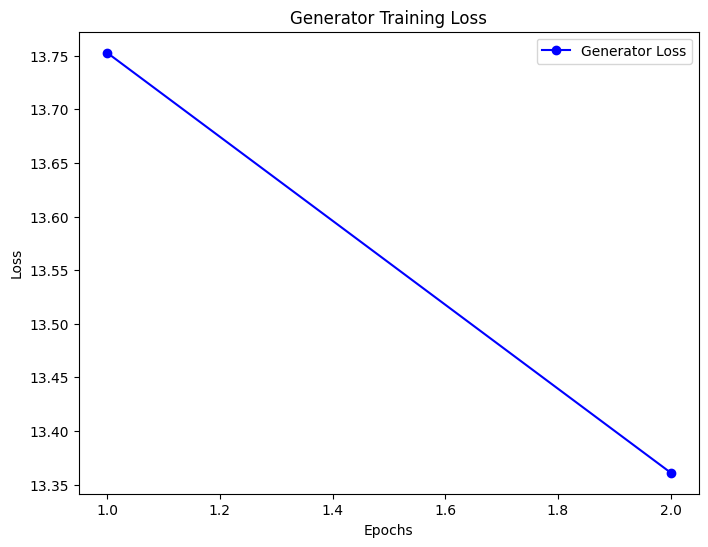

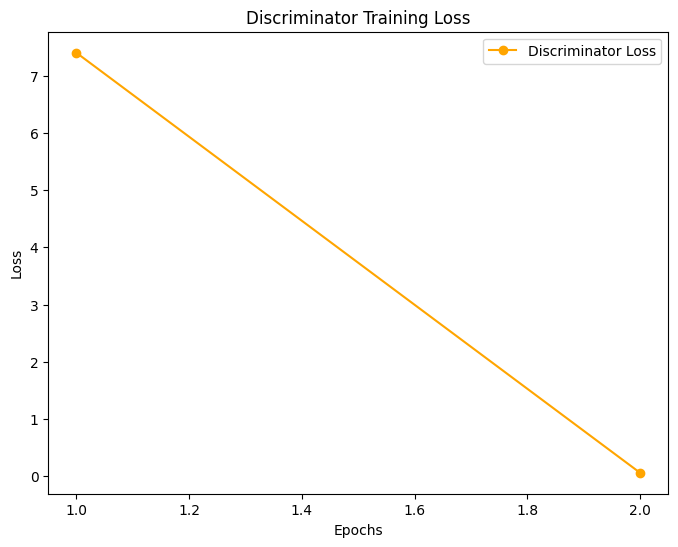

In [16]:
# Loss Visualization 
plt.figure(figsize=(8, 6))
plt.plot(range(1, epochs+1), gen_losses, color='blue', marker='o', label='Generator Loss')
plt.title('Generator Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

plt.figure(figsize=(8, 6))
plt.plot(range(1, epochs+1), disc_losses, color='orange', marker='o', label='Discriminator Loss')
plt.title('Discriminator Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


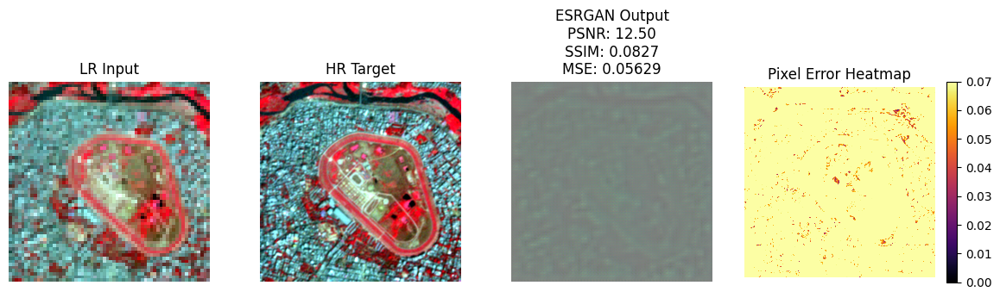

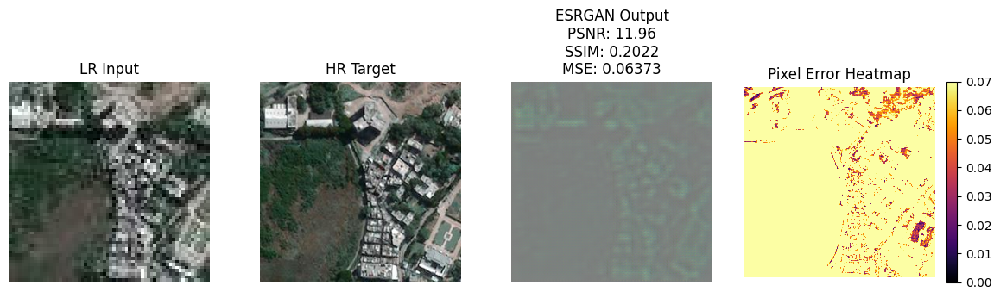

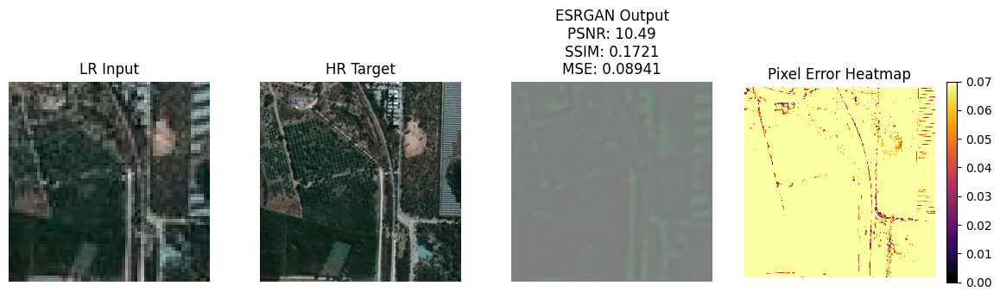

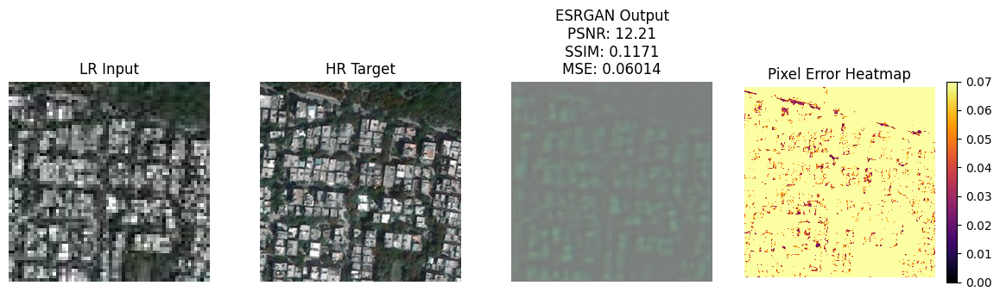

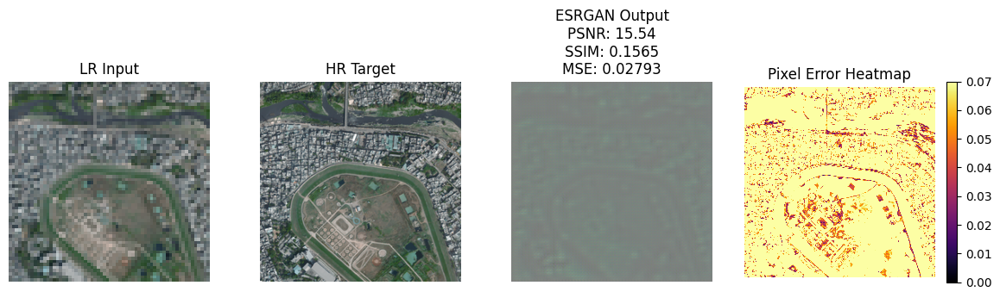

...

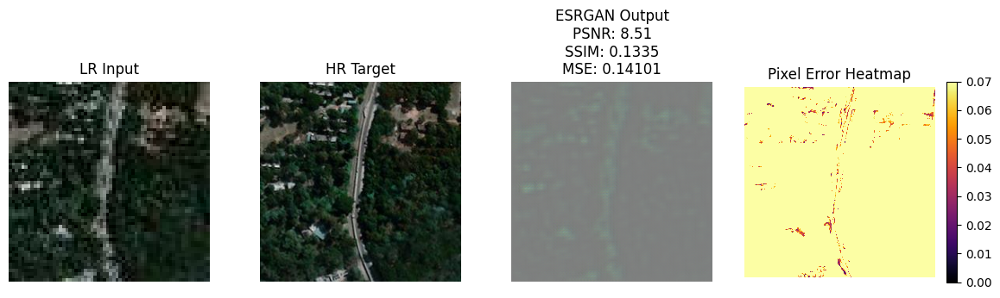

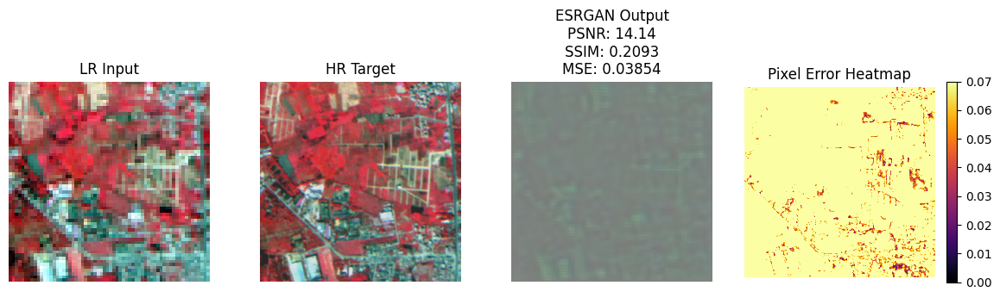

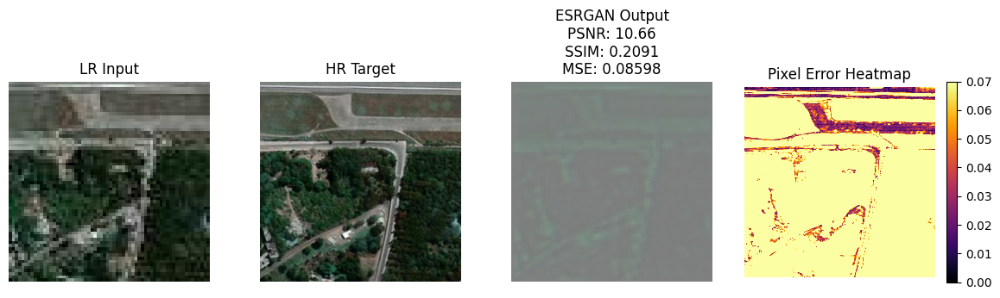

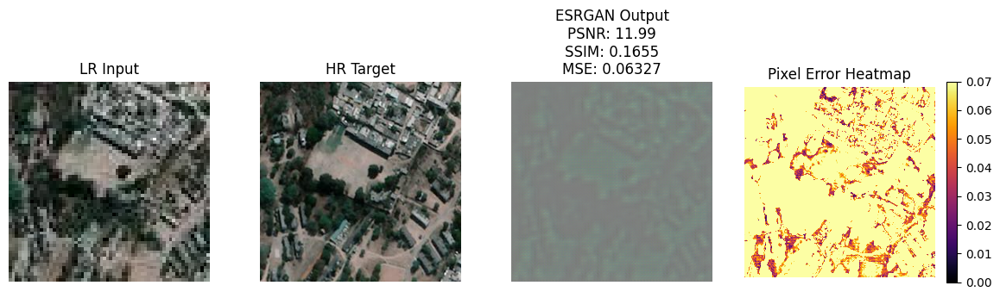

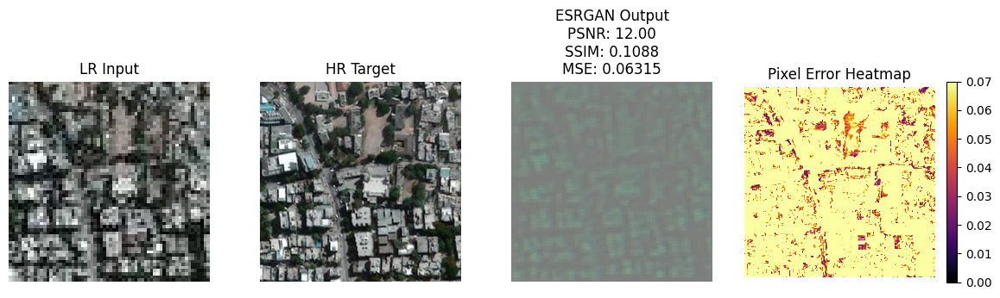

In [17]:
# Sample Comparisons
def plot_gan_samples(gan_metrics, num_samples=30):
    indices = np.random.choice(len(gan_metrics['lr_samples']), num_samples)
    for idx in indices:
        plt.figure(figsize=(12,6))
        # LR Input (BGR -> RGB for display)
        plt.subplot(241)
        lr_bgr = gan_metrics['lr_samples'][idx]
        plt.imshow(bgr_to_rgb(lr_bgr))
        plt.title('LR Input')
        plt.axis('off')
        
        # HR Target (BGR -> RGB for display)
        plt.subplot(242)
        hr_bgr = gan_metrics['hr_samples'][idx]
        plt.imshow(bgr_to_rgb(hr_bgr))
        plt.title('HR Target')
        plt.axis('off')
        
        # SR Output (BGR -> RGB for display)
        plt.subplot(243)
        sr_bgr = gan_metrics['sr_samples'][idx]
        metrics_text = f"PSNR: {gan_metrics['psnr'][idx]:.2f}\nSSIM: {gan_metrics['ssim'][idx]:.4f}\nMSE: {gan_metrics['mse'][idx]:.5f}"
        plt.imshow(bgr_to_rgb(sr_bgr))
        plt.title('ESRGAN Output\n' + metrics_text)
        plt.axis('off')
        
        # Error Map
        plt.subplot(244)
        error = np.abs(hr_bgr - sr_bgr)
        plt.imshow(np.mean(error, axis=-1), cmap='inferno', vmin=0, vmax=0.07)
        plt.title('Pixel Error Heatmap')
        plt.colorbar()
        plt.axis('off')
        plt.tight_layout()
        plt.show()

plot_gan_samples(gan_metrics)


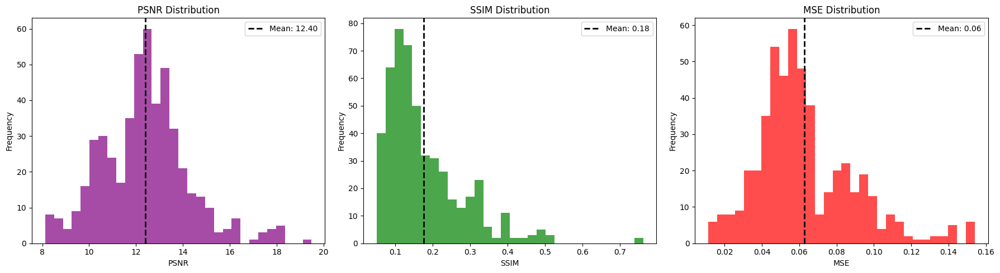

In [18]:
# Metric Distributions
def plot_gan_metrics(gan_metrics):
    fig, axs = plt.subplots(1, 3, figsize=(18,5))
    metrics = ['psnr', 'ssim', 'mse']
    titles = ['PSNR Distribution', 'SSIM Distribution', 'MSE Distribution']
    colors = ['purple', 'green', 'red']
    for ax, metric, title, color in zip(axs, metrics, titles, colors):
        ax.hist(gan_metrics[metric], bins=30, alpha=0.7, color=color)
        ax.set_title(title)
        ax.set_xlabel(metric.upper())
        ax.set_ylabel('Frequency')
        mean_val = np.mean(gan_metrics[metric])
        ax.axvline(mean_val, color='black', linestyle='dashed', linewidth=2, label=f'Mean: {mean_val:.2f}')
        ax.legend()
    plt.tight_layout()
    plt.show()

plot_gan_metrics(gan_metrics)

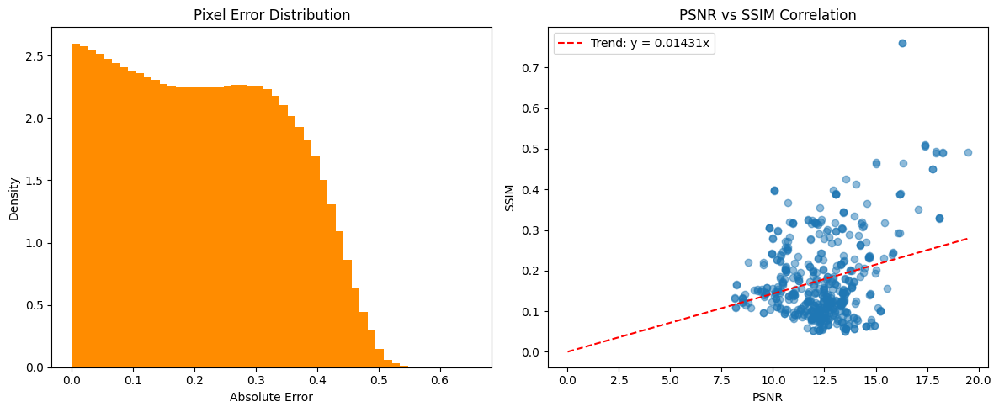

In [19]:
# Error Analysis
def plot_gan_error_analysis(gan_metrics):
    fig, axs = plt.subplots(1, 2, figsize=(12,5))
    errors = np.concatenate([np.abs(hr - sr) for hr, sr in zip(gan_metrics['hr_samples'], gan_metrics['sr_samples'])])
    axs[0].hist(errors.flatten(), bins=50, color='darkorange', density=True)
    axs[0].set_title('Pixel Error Distribution')
    axs[0].set_xlabel('Absolute Error')
    axs[0].set_ylabel('Density')
    
    axs[1].scatter(gan_metrics['psnr'], gan_metrics['ssim'], alpha=0.5)
    axs[1].set_title('PSNR vs SSIM Correlation')
    axs[1].set_xlabel('PSNR')
    axs[1].set_ylabel('SSIM')
    
    psnr_data = np.array(gan_metrics['psnr'])
    ssim_data = np.array(gan_metrics['ssim'])
    X = psnr_data.reshape(-1, 1)
    y = ssim_data
    m, _, _, _ = np.linalg.lstsq(X, y, rcond=None)
    
    x_line = np.linspace(0, psnr_data.max(), 100)
    y_line = m[0] * x_line
    axs[1].plot(x_line, y_line, color='red', linestyle='--', label=f'Trend: y = {m[0]:.5f}x')
    axs[1].legend()
    plt.tight_layout()
    plt.show()

plot_gan_error_analysis(gan_metrics)